In [ ]:
import re

# The provided string
cpc_codes = "C10M2229/043,C10M2201/14,C10M2207/22,C10M2207/34,C10M2207/283,C10N2030/08,C10N2040/12,C10M2229/04,C10M2217/043,C10M169/02,C10N2040/12,C10M2207/129,C10M2227/02,C10M2211/02,C10N2040/13,C10M2229/044,C10M2207/286,C10M2229/041,C10M2229/05,C10M2207/129,C10M2211/02,C10M2229/04,C10M2207/282,C10M2207/281,C10N2050/10,C10N2050/08,C10M2215/064,C10M2201/14,C10M2229/044,C10N2050/10,C10M2217/042,C10M2229/02,C10M2207/34,C10M2207/283,C10M2207/286,C10M169/02,C10M2207/281,C10M2229/05,C10M2219/108,C10M2223/041,C10M2227/02,C10M2207/22,C10M2217/042,C10M2207/282,C10M2207/123,C10M2223/041,C10M2229/041,C10N2030/08,C10M2229/051,C10M2207/123,C10N2040/13,C10M2215/064,C10N2050/08,C10M2229/043,C10M2215/065,C10M2229/02,C10M2215/065,C10M2229/051,C10M2219/108,C10M2217/043"

import re

# Adjust the regular expression to capture four digits that could be preceded by anything except another digit
four_digit_sequences = re.findall(r'(?<!\d)(\d{4})', cpc_codes)

# Use a set to find unique sequences
unique_sequences = set(four_digit_sequences)

# Count the unique sequences
unique_count = len(unique_sequences)

print(f"Number of unique four-digit sequences: {unique_count}")


Number of unique four-digit sequences: 12


In [ ]:
!pip install geopandas matplotlib

In [ ]:
!pip install imageio

In [ ]:
import pandas as pd
from google.colab import files
import io
import geopandas as gpd
import matplotlib.pyplot as plt

In [ ]:
uploaded = files.upload()
df = pd.read_csv('/content/working_data_1.csv')
df.head(5)

Saving working_data_1.csv to working_data_1 (1).csv


,publication_number,cpc_code,loc_longitude,loc_latitude,year
0,DE-24-C,A47G21/165,9.172030,48.767792,1877
1,DE-1037-C,"C10B53/02,Y02E50/14",14.724856,50.655670,1877
2,DE-1003-C,A63D15/16,-100.873290,21.974831,1877
3,DE-1158-C,A47J17/16,8.605990,50.124378,1877
4,DE-215-C,A45B21/00,151.202610,-33.948193,1877


In [ ]:
import io
import zipfile
uploaded = files.upload()
zip_file_name = list(uploaded.keys())[0]
zip_content = uploaded[zip_file_name]

with zipfile.ZipFile(io.BytesIO(zip_content), 'r') as zip_ref:
    temp_dir = '/content/temp_extract'
    zip_ref.extractall(temp_dir)

shapefile_path = f'{temp_dir}/German_Union (GER)_1870_v.1.0.shp'
map1 = gpd.read_file(shapefile_path)

Saving map_prussia_1870.zip to map_prussia_1870 (1).zip


In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.axis('off')

# Plot map1 as the background
map1.plot(ax=ax, alpha=0.5, color="gray")

plt.show()

<IPython.core.display.Javascript object>

In [ ]:
map1.head()

,AREA,PERIMETER,ID,LAND,NAME,STATUS,RB,TYPE,geometry
0,855.057882,196.230610,11001,11000,ZERBST,K,/,/,"MULTIPOLYGON (((335960.400 5761583.000, 335675..."
1,436.241729,151.840205,11003,11000,DESSAU,K,/,/,"POLYGON ((330133.589 5749059.269, 329077.200 5..."
2,408.685103,141.882085,11005,11000,BERNBURG,K,/,/,"MULTIPOLYGON (((277472.700 5763845.600, 278054..."
3,362.501964,122.257485,11004,11000,KOETHEN,K,/,/,"POLYGON ((296544.746 5744863.172, 296534.759 5..."
4,335.383568,120.823802,11006,11000,BALLENSTEDT,K,/,/,"MULTIPOLYGON (((251199.900 5740638.300, 251110..."


In [ ]:
from shapely.geometry import Point
city_names = [
    'Hamburg', 'Leipzig', 'Mannheim','Memel',
    'Danzig', 'Stettin', 'Stralsund', 'Frankfurt', 'Berlin', 'Magdeburg', 'Köln',
    'Schweidnitz', 'Münster', 'Aachen'
]

city_coordinates = [
    (9.9872, 53.5488),      # Hamburg
    (12.3731, 51.3397),     # Leipzig
    (8.4660, 49.4875),      # Mannheim
    (21.1443, 55.7033),     # Memel
    (18.6466, 54.3520),     # Danzig
    (14.5528, 53.4285),     # Stettin
    (13.0770, 54.3091),     # Stralsund
    (14.5506, 52.3472),     # Frankfurt
    (13.4050, 52.5200),     # Berlin
    (11.616667, 52.133331), # Magdeburg
    (6.953101, 50.935173),  # Köln
    (16.4757, 50.8498),     # Schweidnitz
    (7.6261, 51.9607),      # Münster
    (6.083611, 50.775555)   # Aachen
]

geometry = [Point(xy) for xy in city_coordinates]
data = {'City': city_names, 'Geometry': geometry}
gdfPlaces = gpd.GeoDataFrame(data, geometry='Geometry')
gdfPlaces

,City,Geometry
0,Hamburg,POINT (9.98720 53.54880)
1,Leipzig,POINT (12.37310 51.33970)
2,Mannheim,POINT (8.46600 49.48750)
3,Memel,POINT (21.14430 55.70330)
4,Danzig,POINT (18.64660 54.35200)
5,Stettin,POINT (14.55280 53.42850)
6,Stralsund,POINT (13.07700 54.30910)
7,Frankfurt,POINT (14.55060 52.34720)
8,Berlin,POINT (13.40500 52.52000)
9,Magdeburg,POINT (11.61667 52.13333)


In [ ]:
# Set the CRS for gdfPlaces to EPSG 4326 (WGS 84)
gdfPlaces = gdfPlaces.set_crs(epsg=4326)

# Transform gdfPlaces to the CRS of map1
#gdfPlaces = gdfPlaces.to_crs(map1.crs)
map1 = map1.to_crs(gdfPlaces.crs)

In [ ]:


# Transform map1 to the CRS of gdfPlaces
map1 = map1.to_crs(gdfPlaces.crs)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# Turn off the axis
ax.axis('off')

# Plot map1 and gdfPlaces with pink color
map1.plot(ax=ax, alpha=0.7, color="lightgray")
gdfPlaces.plot(ax=ax, alpha=1, color="black", markersize=3, label="Cities")

# Add labels to the city points
for idx, row in gdfPlaces.iterrows():
    ax.annotate(row['City'], (row['Geometry'].x, row['Geometry'].y), fontsize=8,
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points')


# Show the plot
plt.show()

<IPython.core.display.Javascript object>

In [ ]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Assuming 'df' is your DataFrame containing 'loc_longitude' and 'loc_latitude' columns
# Make a copy of the DataFrame
df_copy = df.copy()

# Create a geometry column using longitude and latitude
geometry = [Point(xy) for xy in zip(df_copy['loc_longitude'], df_copy['loc_latitude'])]

# Create a GeoDataFrame
geo_df = gpd.GeoDataFrame(df_copy, geometry=geometry)

In [ ]:
geo_df.head()

,publication_number,cpc_code,loc_longitude,loc_latitude,year,geometry
0,DE-24-C,A47G21/165,9.172030,48.767792,1877,POINT (9.17203 48.76779)
1,DE-1037-C,"C10B53/02,Y02E50/14",14.724856,50.655670,1877,POINT (14.72486 50.65567)
2,DE-1003-C,A63D15/16,-100.873290,21.974831,1877,POINT (-100.87329 21.97483)
3,DE-1158-C,A47J17/16,8.605990,50.124378,1877,POINT (8.60599 50.12438)
4,DE-215-C,A45B21/00,151.202610,-33.948193,1877,POINT (151.20261 -33.94819)


In [ ]:
# Set the CRS for gdfPlaces to EPSG 4326 (WGS 84)
geo_df = geo_df.set_crs(epsg=4326)

# Transform gdfPlaces to the CRS of map1
#gdfPlaces = gdfPlaces.to_crs(map1.crs)
map1 = map1.to_crs(geo_df.crs)

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


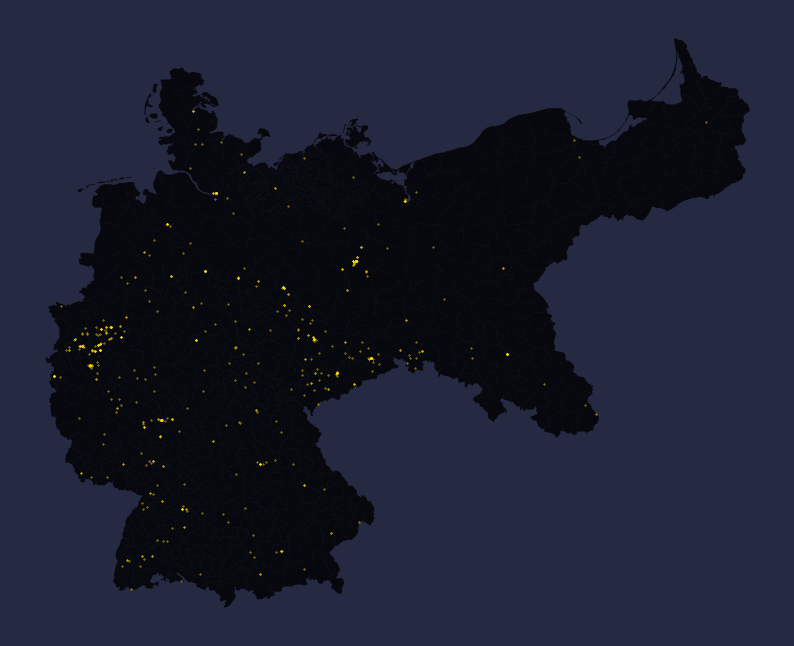

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming 'map1' is your GeoDataFrame representing the map boundaries
# Assuming 'geo_df' is your GeoDataFrame containing the points

# Spatial join to keep only the points that fall within the bounds of 'map1'
geo_df_within_map1 = gpd.sjoin(geo_df, map1, op='within')

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

hex_color = '#252941'
rgb_color = tuple(int(hex_color[i:i+2], 16) / 255.0 for i in (1, 3, 5))
fig.patch.set_facecolor(rgb_color)

# Turn off the axis
ax.axis('off')

# Plot map1 and filtered gdfPlaces with pink color
map1.plot(ax=ax, alpha=0.8, color="black")
geo_df_within_map1[geo_df_within_map1['year'] == 1877].plot(ax=ax, alpha=1, color="gold", markersize=0.1)

# Show the plot
plt.show()


In [ ]:
geo_df_within_map1.head()

,publication_number,cpc_code,loc_longitude,loc_latitude,year,geometry,index_right,AREA,PERIMETER,ID,LAND,NAME,STATUS,RB,TYPE
0,DE-24-C,A47G21/165,9.17203,48.767792,1877,POINT (9.17203 48.76779),383,26.376341,22.233428,18030,18000,STUTTGART,S,/,/
418,DE-934-C,D06F75/02,9.17203,48.767792,1877,POINT (9.17203 48.76779),383,26.376341,22.233428,18030,18000,STUTTGART,S,/,/
463,DE-454-C,G10C3/14,9.17203,48.767792,1877,POINT (9.17203 48.76779),383,26.376341,22.233428,18030,18000,STUTTGART,S,/,/
1011,DE-1044-C,B43L7/0275,9.17203,48.767792,1877,POINT (9.17203 48.76779),383,26.376341,22.233428,18030,18000,STUTTGART,S,/,/
1060,DE-1834-C,B21D7/063,9.17203,48.767792,1877,POINT (9.17203 48.76779),383,26.376341,22.233428,18030,18000,STUTTGART,S,/,/


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Ensure 'map1' and 'geo_df_within_map1' are defined as in your previous setup

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# Set the figure background color
hex_color = '#252941'
rgb_color = tuple(int(hex_color[i:i+2], 16) / 255.0 for i in (1, 3, 5))
fig.patch.set_facecolor(rgb_color)

# Function to update the plot for each frame
def update(year):
    ax.clear()  # Clear previous frame
    ax.axis('off')  # Turn off the axis
    map1.plot(ax=ax, alpha=0.8, color="black")  # Plot map boundaries
    # Plot points for the current year
    geo_df_within_map1[geo_df_within_map1['year'] == year].plot(ax=ax, alpha=1, color="gold", markersize=0.1)

# Create the animation
ani = FuncAnimation(fig, update, frames=range(1877, 1930), repeat=False)

# Display the animation
plt.show()

# To save the animation, you can use:
ani.save('animation.gif', writer='imagemagick', fps=2)


<IPython.core.display.Javascript object>

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Assuming 'map1' and 'geo_df_within_map1' are already defined as per your setup

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# Set the figure background color
hex_color = '#252941'
rgb_color = tuple(int(hex_color[i:i+2], 16) / 255.0 for i in (1, 3, 5))
fig.patch.set_facecolor(rgb_color)

# Function to update the plot for each frame
def update(year):
    ax.clear()  # Clear previous frame
    ax.axis('off')  # Turn off the axis
    map1.plot(ax=ax, alpha=0.8, color="black")  # Plot map boundaries
    # Plot points for the current year
    geo_df_within_map1[geo_df_within_map1['year'] == year].plot(ax=ax, alpha=1, color="gold", markersize=0.1)
    # Display the year in the top left corner
    ax.text(0.01, 0.99, str(year), transform=ax.transAxes, color="white", fontsize=15, verticalalignment='top')

# Create the animation
ani = FuncAnimation(fig, update, frames=range(1877, 1930), repeat=False)

# To save the animation, use:
#ani.save('animation.gif', writer='imagemagick', fps=2)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

In [ ]:
uploaded = files.upload()
zip_file_name = list(uploaded.keys())[0]
zip_content = uploaded[zip_file_name]

with zipfile.ZipFile(io.BytesIO(zip_content), 'r') as zip_ref:
    temp_dir = '/content/temp_extract'
    zip_ref.extractall(temp_dir)

shapefile_path = f'{temp_dir}/railways.shp'
gdfRails = gpd.read_file(shapefile_path)

Saving railways.zip to railways.zip


In [ ]:
map1 = map1.to_crs(gdfRails.crs)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Turn off the axis
ax.axis('off')

# Plot gdfRails on map1
gdfRails.plot(ax=ax, alpha=1, color="white", markersize=1)

# Plot map1 with gdfRails as the background
map1.plot(ax=ax, alpha=0.7, color="lightgray")

# Plot gdfPlaces on top of map1


# Show the plot
plt.show()

<IPython.core.display.Javascript object>